# Object masks from prompts with SAM2 and OpenVINO for Images

<div class="alert alert-block alert-danger"> <b>Important note:</b> This notebook requires python >= 3.10. Please make sure that your environment fulfill to this requirement before running it </div>




### Installation Instructions

This is a self-contained example that relies solely on its own code.

We recommend  running the notebook in a virtual environment. You only need a Jupyter server to start.
For details, please refer to [Installation Guide](https://github.com/openvinotoolkit/openvino_notebooks/blob/latest/README.md#-installation-guide).

<img referrerpolicy="no-referrer-when-downgrade" src="https://static.scarf.sh/a.png?x-pxid=5b5a4db0-7875-4bfb-bdbd-01698b5b1a77&file=notebooks/sam2-image-segmentation/segment-anything-2-image.ipynb" />


#### Table of contents:

- [Prerequisites](#Prerequisites)
- [Image prediction](#Image-prediction)
- [Prepare image](#Prepare-image)
- [Download and inference PyTorch model](#Download-and-inference-PyTorch-model)
- [Convert model to OpenVINO Intermediate Representation](#Convert-model-to-OpenVINO-Intermediate-Representation)
    - [Image Encoder](#Image-Encoder)
    - [Mask predictor](#Mask-predictor)
- [Run OpenVINO model in interactive segmentation mode](#Run-OpenVINO-model-in-interactive-segmentation-mode)
    - [Example Image](#Example-Image)
    - [Preprocessing and visualization utilities](#Preprocessing-and-visualization-utilities)
    - [Image encoding](#Image-encoding)
    - [Example point input](#Example-point-input)
    - [Example with multiple points](#Example-with-multiple-points)
    - [Example box and point input with negative label](#Example-box-and-point-input-with-negative-label)
- [Interactive segmentation with Gradio](#Interactive-segmentation-with-Gradio)
- [Run OpenVINO model in automatic mask generation mode](#Run-OpenVINO-model-in-automatic-mask-generation-mode)
- [Optimize encoder using NNCF Post-training Quantization API](#Optimize-encoder-using-NNCF-Post-training-Quantization-API)
    - [Prepare a calibration dataset](#Prepare-a-calibration-dataset)
    - [Run quantization and serialize OpenVINO IR model](#Run-quantization-and-serialize-OpenVINO-IR-model)
    - [Validate Quantized Model Inference](#Validate-Quantized-Model-Inference)
    - [Compare Performance of the Original and Quantized Models](#Compare-Performance-of-the-Original-and-Quantized-Models)



Segmentation - identifying which image pixels belong to an object - is a core task in computer vision and is used in a broad array of applications, from analyzing scientific imagery to editing photos. But creating an accurate segmentation model for specific tasks typically requires highly specialized work by technical experts with access to AI training infrastructure and large volumes of carefully annotated in-domain data. Reducing the need for task-specific modeling expertise, training compute, and custom data annotation for image segmentation is the main goal of the Segment Anything project.

[Segment Anything Model 2 (SAM 2)](https://segment-anything.com/) is a foundation model towards solving promptable visual segmentation in images and videos. It extend SAM to video by considering images as a video with a single frame. When SAM 2 is applied to images the model behaves like SAM. SAM 2 has all the capabilities of SAM on static images. The model first converts the image into an image embedding that allows high quality masks to be efficiently produced from a prompt. A promptable and light-weight mask decoder accepts a image embedding and prompts (if any) on the current image and outputs a segmentation mask. SAM 2 supports point, box, and mask prompts.

This notebook shows an example of how to convert and use Segment Anything Model 2 in OpenVINO format, allowing it to run on a variety of platforms that support an OpenVINO.

The diagram below demonstrates the SAM 2 architecture. For a given frame, the segmentation prediction is conditioned on the current prompt and/or on previously observed memories. Videos are processed in a streaming fashion with frames being consumed one at a time by the image encoder, and cross-attended to memories of the target object from previous frames. The mask decoder, which optionally also takes input prompts, predicts the segmentation mask for that frame. Finally, a memory encoder transforms the prediction and image encoder embeddings (not shown in the figure) for use in future frames

![model_diagram](https://raw.githubusercontent.com/facebookresearch/segment-anything-2/main/assets/model_diagram.png)


More details about approach can be found in the [paper](https://ai.meta.com/research/publications/sam-2-segment-anything-in-images-and-videos/), original [repo](https://github.com/facebookresearch/segment-anything-2) and [Meta AI blog post](https://ai.meta.com/blog/segment-anything-2/)

## Prerequisites
[back to top ⬆️](#Table-of-contents:)


In [ ]:
%pip install -q "gradio>=4.13,<4.41.0" "fastapi==0.112.4" "openvino>=2024.4.0" "nncf>=2.13" "torch>=2.3.1" "torchvision>=0.18.1" opencv-python tqdm numpy  --extra-index-url https://download.pytorch.org/whl/cpu
%pip install "iopath>=0.1.10" "pillow>=9.4.0"  "hydra-core>=1.3.2"

%pip install -q "matplotlib>=3.4"

In [ ]:
import requests
from pathlib import Path


if not Path("notebook_utils.py").exists():
    r = requests.get(
        url="https://raw.githubusercontent.com/openvinotoolkit/openvino_notebooks/latest/utils/notebook_utils.py",
    )
    open("notebook_utils.py", "w").write(r.text)

if not Path("cmd_helper.py").exists():
    r = requests.get(
        url="https://raw.githubusercontent.com/openvinotoolkit/openvino_notebooks/latest/utils/cmd_helper.py",
    )
    open("cmd_helper.py", "w").write(r.text)


from notebook_utils import download_file

# Read more about telemetry collection at https://github.com/openvinotoolkit/openvino_notebooks?tab=readme-ov-file#-telemetry
from notebook_utils import collect_telemetry

collect_telemetry("segment-anything-2-image.ipynb")

Clone and install segment-anything-2

In [ ]:
from cmd_helper import clone_repo


repo_dir = clone_repo("https://github.com/facebookresearch/sam2.git")

env: SAM2_BUILD_CUDA=0


In [ ]:
%env SAM2_BUILD_CUDA=0
%cd sam2
%pip install -q -e .
%cd ..

In [7]:
ov_sam2_helper_file_name = "ov_sam2_helper.py"

if not Path(ov_sam2_helper_file_name).exists():
    r = requests.get(
        url=f"https://raw.githubusercontent.com/openvinotoolkit/openvino_notebooks/latest/notebooks/sam2-image-segmentation/{ov_sam2_helper_file_name}",
    )
    open(ov_sam2_helper_file_name, "w").write(r.text)

## Image prediction
[back to top ⬆️](#Table-of-contents:)

## Prepare image
[back to top ⬆️](#Table-of-contents:)

In [9]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

image_path = Path("truck.jpg")
if not image_path.exists():
    download_file("https://raw.githubusercontent.com/facebookresearch/segment-anything/main/notebooks/images/truck.jpg")

image = Image.open(image_path)
image = np.array(image.convert("RGB"))

'truck.jpg' already exists.


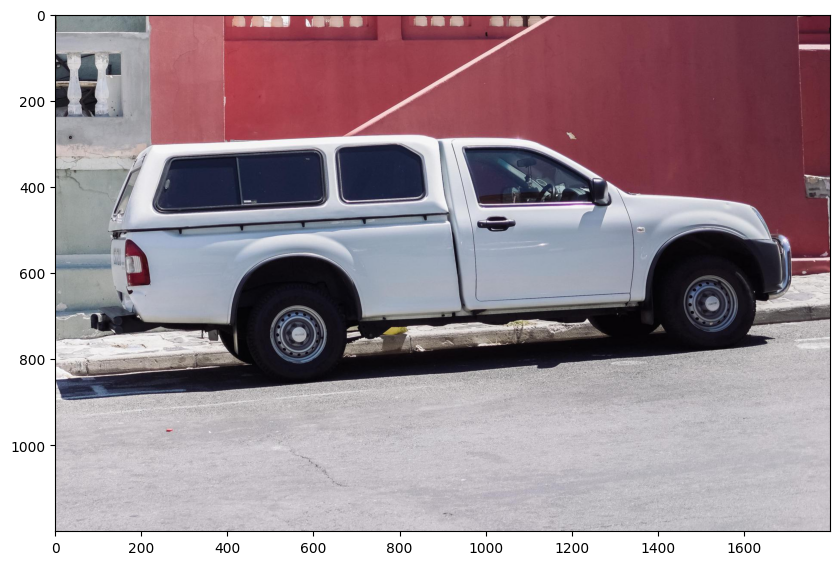

In [10]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
plt.axis("on")
plt.show()

## Download and inference PyTorch model
[back to top ⬆️](#Table-of-contents:)


There are several [Segment Anything V2 Models](https://github.com/facebookresearch/segment-anything-2?tab=readme-ov-file#model-description) available for downloading. In this tutorial we will use model based on `sam2-hiera-large`, but the demonstrated approach is very general and applicable to other SAM models.


SAM2 provide image prediction APIs that closely resemble SAM for image use cases. The `SAM2ImagePredictor` class has an easy interface for image prompting. Also the model could be loaded by `SAM2ImagePredictor` from [HuggingFace](https://huggingface.co/facebook/sam2-hiera-large). List of other SAM2 models could be found [here](https://huggingface.co/models?search=facebook/sam2).

In [11]:
from sam2.sam2_image_predictor import SAM2ImagePredictor

predictor = SAM2ImagePredictor.from_pretrained("facebook/sam2-hiera-large", device="cpu")

In [9]:
input_point = np.array([[500, 375]])
input_label = np.array([1])

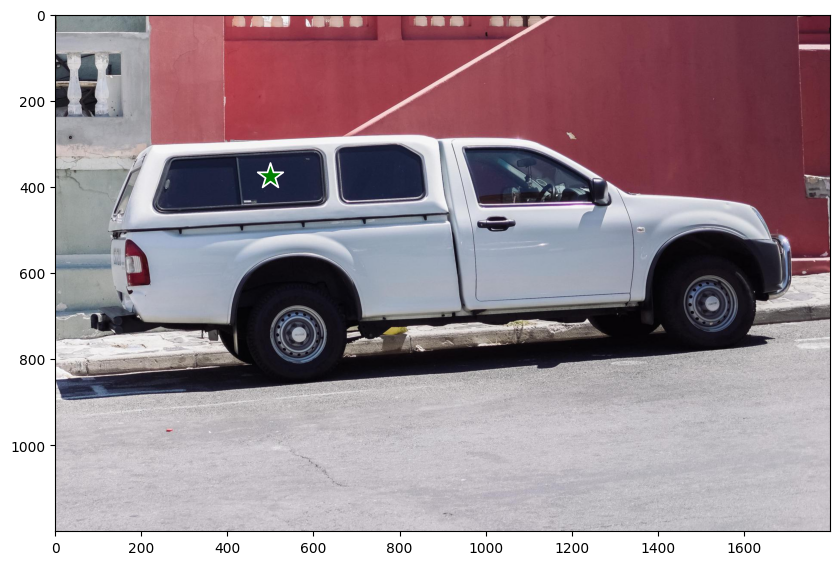

In [10]:
from ov_sam2_helper import show_points

plt.figure(figsize=(10, 10))
plt.imshow(image)
show_points(input_point, input_label, plt.gca())
plt.axis("on")
plt.show()

In [11]:
predictor.set_image(image)

masks, scores, logits = predictor.predict(point_coords=input_point, point_labels=input_label, multimask_output=False)

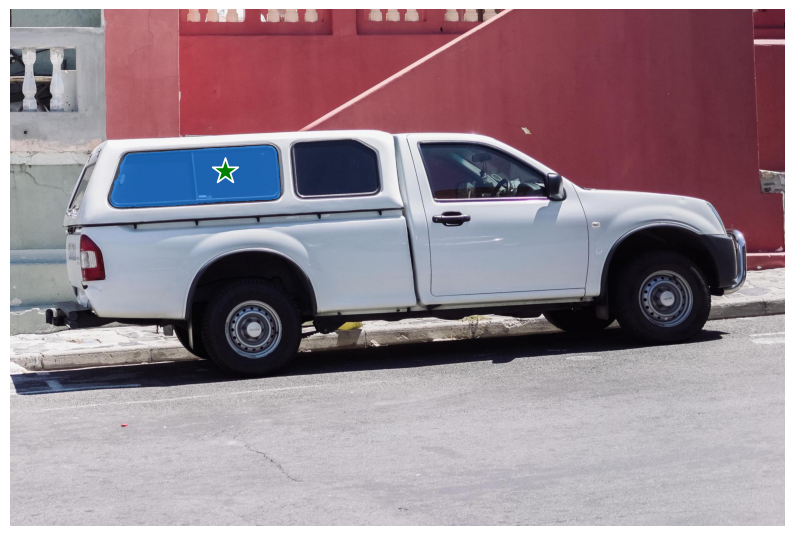

In [12]:
from ov_sam2_helper import show_masks

show_masks(image, masks, point_coords=input_point, input_labels=input_label)

In [13]:
predictor.reset_predictor()

## Convert model to OpenVINO Intermediate Representation
[back to top ⬆️](#Table-of-contents:)

We split model on 2 independent parts: image_encoder and mask_predictor, where mask_predictor is combination of Prompt Encoder and Mask Decoder.

In [14]:
import openvino as ov

core = ov.Core()

In [15]:
from notebook_utils import device_widget

device = device_widget()

device

Dropdown(description='Device:', index=1, options=('CPU', 'AUTO'), value='AUTO')

### Image Encoder
[back to top ⬆️](#Table-of-contents:)


The image encoder is only run once for the entire interaction and its role is to provide unconditioned tokens (feature embeddings) representing each frame. Then changing prompt, prompt encoder and mask decoder can be run multiple times to retrieve different objects from the same image. 

Image Encoder input is tensor with shape `1x3x1024x1024` in `NCHW` format, contains image for segmentation.
Image Encoder output is image embeddings, tensor with shape `1x256x64x64` and two tensors of high resolution features with shapes `1x32x256x256` and `1x64x128x128`.


To learn more about conversion of Image Encoder, please, see `SamImageEncoderModel` from `ov_sam2_helper.py`.

In [16]:
import warnings
import torch
from ov_sam2_helper import SamImageEncoderModel

ov_encoder_path = Path("ov_image_encoder.xml")
if not ov_encoder_path.exists():
    with warnings.catch_warnings():
        warnings.filterwarnings("ignore", category=torch.jit.TracerWarning)
        warnings.filterwarnings("ignore", category=UserWarning)

        image_encoder = SamImageEncoderModel(predictor)
        ov_encoder_model = ov.convert_model(
            image_encoder,
            example_input=torch.zeros(1, 3, 1024, 1024),
            input=([1, 3, 1024, 1024],),
        )
    ov.save_model(ov_encoder_model, ov_encoder_path)
else:
    ov_encoder_model = core.read_model(ov_encoder_path)

In [17]:
ov_encoder = core.compile_model(ov_encoder_model, device.value)

### Mask predictor
[back to top ⬆️](#Table-of-contents:)

Mask prediction will be includes two models:
* **Prompt Encoder** - Encoder for segmentation condition. As a condition can be used points, boxes or segmentation mask.
* **Mask Decoder** - The mask decoder efficiently maps the image embedding, prompt embeddings, and an output token to a mask.

Combined prompt encoder and mask decoder model has following list of inputs:

* `image_embeddings`: The image embedding from `image_encoder`. Has a batch index of length 1.
* `high_res_feats_256`: The high resolution features from `image_encoder`. Has a batch index of length 1.
* `high_res_feats_128`: The high resolution features from `image_encoder`. Has a batch index of length 1.
* `point_coords`: Coordinates of sparse input prompts, corresponding to both point inputs and box inputs. Boxes are encoded using two points, one for the top-left corner and one for the bottom-right corner. *Coordinates must already be transformed to long-side 1024.* Has a batch index of length 1.
* `point_labels`: Labels for the sparse input prompts. 0 is a negative input point, 1 is a positive input point, 2 is a top-left box corner, 3 is a bottom-right box corner, and -1 is a padding point. *If there is no box input, a single padding point with label -1 and coordinates (0.0, 0.0) should be concatenated.


Model outputs:

* `masks` - predicted masks resized to original image size, to obtain a binary mask, should be compared with `threshold` (usually equal 0.0).
* `iou_predictions` - intersection over union predictions
* `low_res_masks` - predicted masks before postprocessing, can be used as mask input for model.


Note that we use the `multimask_output=False` option when converting. This way, the SAM2 model returns a single mask that it define as the best variant. You can also avoid using use_high_res_features by passing `use_high_res_features=False` in `SamImageMaskPredictionModel`.
You can find more details about conversion of Mask Predictor in `SamImageMaskPredictionModel` from `ov_sam2_helper.py`.

In [18]:
from ov_sam2_helper import SamImageMaskPredictionModel


ov_mask_predictor_path = Path("ov_mask_predictor.xml")
if not ov_mask_predictor_path.exists():
    exportable_model = SamImageMaskPredictionModel(predictor.model, multimask_output=False)
    embed_dim = predictor.model.sam_prompt_encoder.embed_dim
    embed_size = predictor.model.sam_prompt_encoder.image_embedding_size

    hf_sizes = predictor._bb_feat_sizes

    dummy_inputs = {
        "image_embeddings": torch.randn(1, embed_dim, *embed_size, dtype=torch.float),
        "high_res_feats_256": torch.randn(1, 32, *hf_sizes[0], dtype=torch.float),
        "high_res_feats_128": torch.randn(1, 64, *hf_sizes[1], dtype=torch.float),
        "point_coords": torch.randint(low=0, high=1024, size=(1, 5, 2), dtype=torch.float),
        "point_labels": torch.randint(low=0, high=4, size=(1, 5), dtype=torch.float),
    }
    with warnings.catch_warnings():
        warnings.filterwarnings("ignore", category=torch.jit.TracerWarning)
        warnings.filterwarnings("ignore", category=UserWarning)
        ov_mask_predictor_model = ov.convert_model(exportable_model, example_input=dummy_inputs)
    ov.save_model(ov_mask_predictor_model, ov_mask_predictor_path)
else:
    ov_mask_predictor_model = core.read_model(ov_mask_predictor_path)

In [19]:
ov_predictor = core.compile_model(ov_mask_predictor_model, device.value)

## Run OpenVINO model in interactive segmentation mode
[back to top ⬆️](#Table-of-contents:)


### Example Image
[back to top ⬆️](#Table-of-contents:)


In [20]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

download_file("https://raw.githubusercontent.com/facebookresearch/segment-anything/main/notebooks/images/truck.jpg")
image = cv2.imread("truck.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

'truck.jpg' already exists.


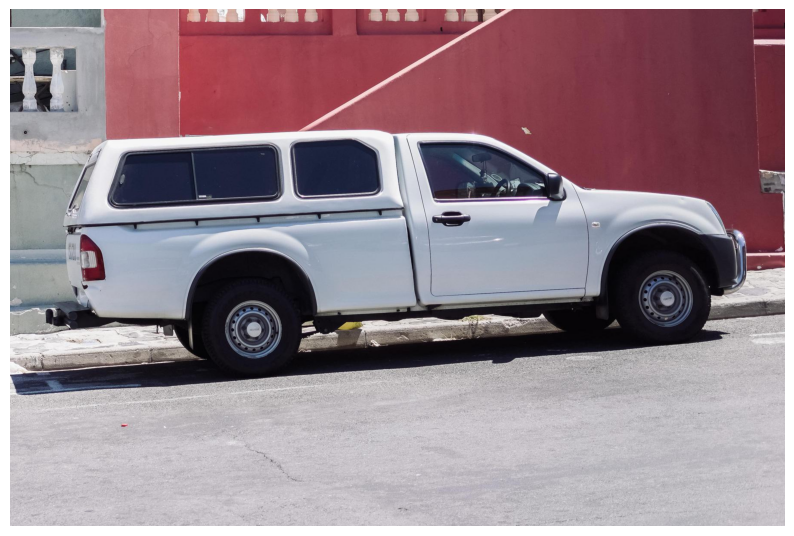

In [21]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
plt.axis("off")
plt.show()

### Preprocessing and visualization utilities
[back to top ⬆️](#Table-of-contents:)

To prepare input for Image Encoder we should:

1. Convert BGR image to RGB
2. Resize image saving aspect ratio where longest size equal to Image Encoder input size - 1024.
3. Normalize image subtract mean values (123.675, 116.28, 103.53) and divide by std (58.395, 57.12, 57.375)
4. Transpose HWC data layout to CHW and add batch dimension.
5. Add zero padding to input tensor by height or width (depends on aspect ratio) according Image Encoder expected input shape.

These steps are applicable to all available models

In [22]:
from ov_sam2_helper import ResizeLongestSide, preprocess_image, postprocess_masks

resizer = ResizeLongestSide(1024)

### Image encoding
[back to top ⬆️](#Table-of-contents:)

To start work with image, we should preprocess it and obtain image embeddings using `ov_encoder`. We will use the same image for all experiments, so it is possible to generate image embedding once and then reuse them.

In [23]:
preprocessed_image = preprocess_image(image, resizer)
encoding_results = ov_encoder(preprocessed_image)

Now, we can try to provide different prompts for mask generation

### Example point input
[back to top ⬆️](#Table-of-contents:)

In this example we select one point. The green star symbol show its location on the image below.

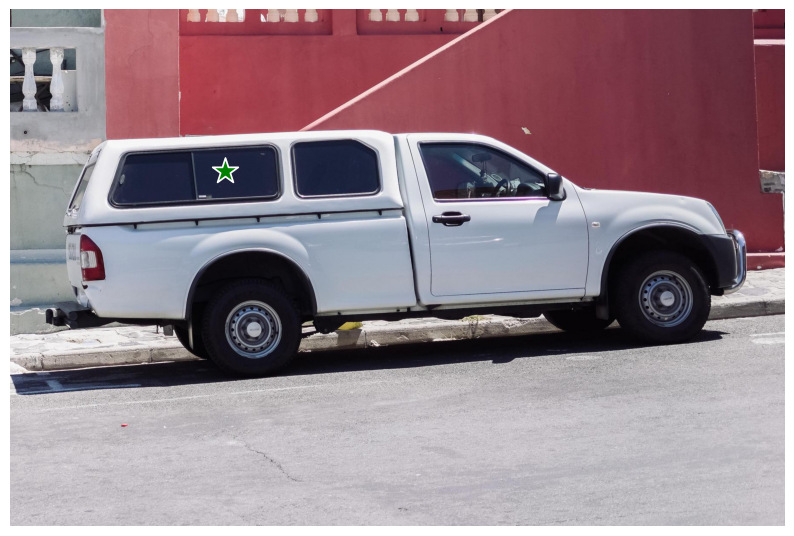

In [24]:
input_point = np.array([[500, 375]])
input_label = np.array([1])

plt.figure(figsize=(10, 10))
plt.imshow(image)
show_points(input_point, input_label, plt.gca())
plt.axis("off")
plt.show()

Add a batch index, concatenate a padding point, and transform it to input tensor coordinate system.

In [25]:
coord = np.concatenate([input_point, np.array([[0.0, 0.0]])], axis=0)[None, :, :]
label = np.concatenate([input_label, np.array([-1])], axis=0)[None, :].astype(np.float32)
coord = resizer.apply_coords(coord, image.shape[:2]).astype(np.float32)

Package the inputs to run in the mask predictor.

In [26]:
inputs = {
    "image_embeddings": torch.from_numpy(encoding_results[ov_encoder.output(0)]),
    "high_res_feats_256": torch.from_numpy(encoding_results[ov_encoder.output(1)]),
    "high_res_feats_128": torch.from_numpy(encoding_results[ov_encoder.output(2)]),
    "point_coords": coord,
    "point_labels": label,
}

Predict a mask and threshold it to get binary mask (0 - no object, 1 - object).

In [27]:
results = ov_predictor(inputs)

masks = results[ov_predictor.output(0)]
masks = postprocess_masks(masks, image.shape[:-1], resizer)

masks = masks > 0.0

In [28]:
mask = masks[0]
mask = np.transpose(mask, (1, 2, 0))

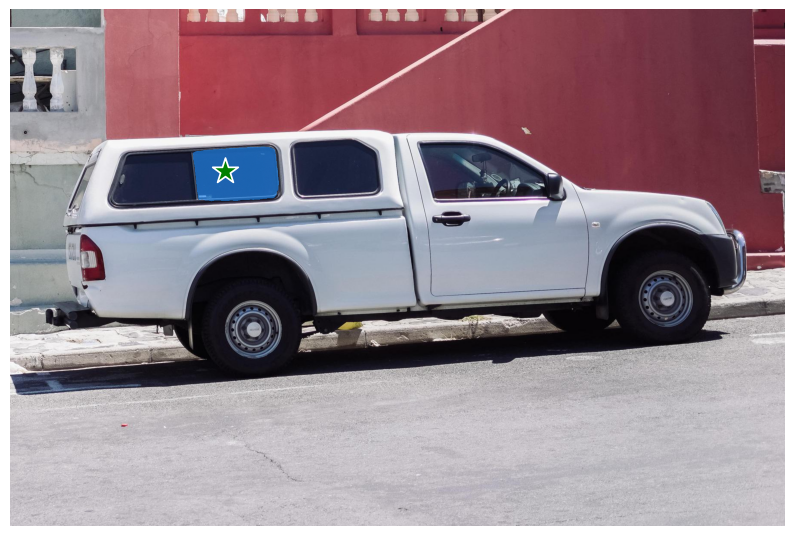

In [29]:
from ov_sam2_helper import show_mask

plt.figure(figsize=(10, 10))
plt.imshow(image)
show_mask(masks, plt.gca())
show_points(input_point, input_label, plt.gca())
plt.axis("off")
plt.show()

### Example with multiple points
[back to top ⬆️](#Table-of-contents:)

in this example, we provide additional point for cover larger object area.

In [30]:
input_point = np.array([[500, 375], [1125, 625], [575, 750], [1405, 575]])
input_label = np.array([1, 1, 1, 1])

Now, prompt for model looks like represented on this image:

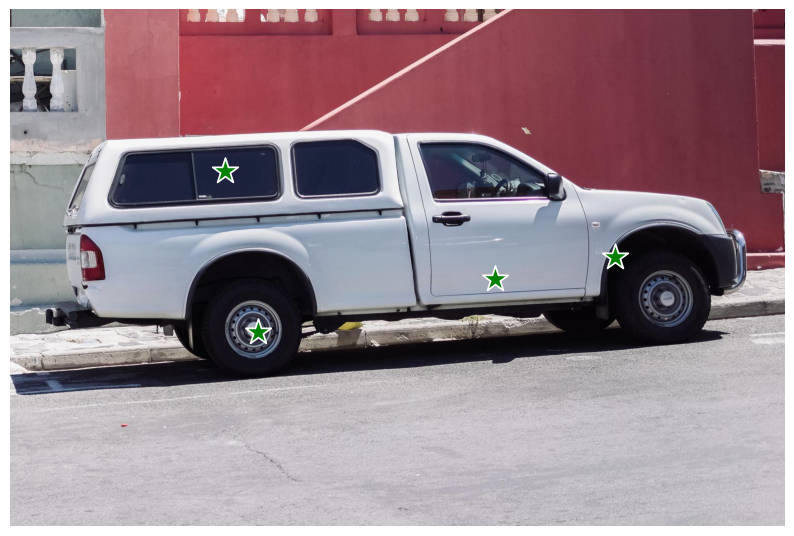

In [31]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_points(input_point, input_label, plt.gca())
plt.axis("off")
plt.show()

Transform the points as in the previous example.

In [32]:
coord = np.concatenate([input_point, np.array([[0.0, 0.0]])], axis=0)[None, :, :]
label = np.concatenate([input_label, np.array([-1])], axis=0)[None, :].astype(np.float32)

coord = resizer.apply_coords(coord, image.shape[:2]).astype(np.float32)

Package inputs, then predict and threshold the mask.

In [33]:
inputs = {
    "image_embeddings": encoding_results[ov_encoder.output(0)],
    "high_res_feats_256": encoding_results[ov_encoder.output(1)],
    "high_res_feats_128": encoding_results[ov_encoder.output(2)],
    "point_coords": coord,
    "point_labels": label,
}

results = ov_predictor(inputs)

masks = results[ov_predictor.output(0)]
masks = postprocess_masks(masks, image.shape[:-1], resizer)
masks = masks > 0.0

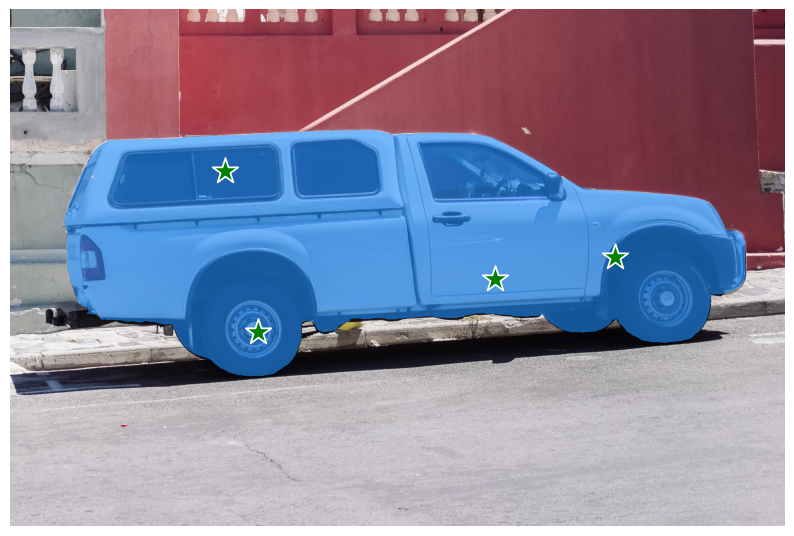

In [34]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_mask(masks, plt.gca())
show_points(input_point, input_label, plt.gca())
plt.axis("off")
plt.show()

Great! Looks like now, predicted mask cover whole truck.

### Example box and point input with negative label
[back to top ⬆️](#Table-of-contents:)

In this example we define input prompt using bounding box and point inside it.The bounding box represented as set of points of its left upper corner and right lower corner. Label 0 for point speak that this point should be excluded from mask.

In [35]:
input_box = np.array([425, 600, 700, 875])
input_point = np.array([[575, 750]])
input_label = np.array([0])

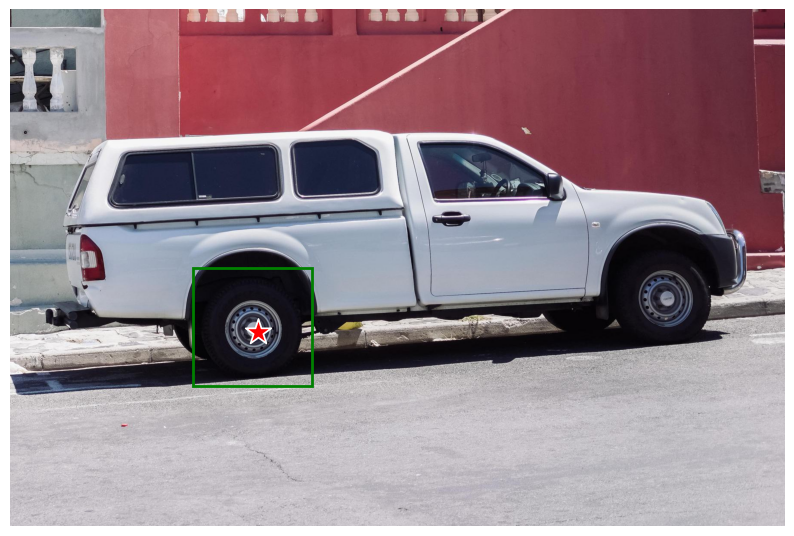

In [36]:
from ov_sam2_helper import show_box

plt.figure(figsize=(10, 10))
plt.imshow(image)
show_box(input_box, plt.gca())
show_points(input_point, input_label, plt.gca())
plt.axis("off")
plt.show()

Add a batch index, concatenate a box and point inputs, add the appropriate labels for the box corners, and transform. There is no padding point since the input includes a box input.

In [37]:
box_coords = input_box.reshape(2, 2)
box_labels = np.array([2, 3])

coord = np.concatenate([input_point, box_coords], axis=0)[None, :, :]
label = np.concatenate([input_label, box_labels], axis=0)[None, :].astype(np.float32)

coord = resizer.apply_coords(coord, image.shape[:2]).astype(np.float32)

Package inputs, then predict and threshold the mask.

In [38]:
inputs = {
    "image_embeddings": encoding_results[ov_encoder.output(0)],
    "high_res_feats_256": encoding_results[ov_encoder.output(1)],
    "high_res_feats_128": encoding_results[ov_encoder.output(2)],
    "point_coords": coord,
    "point_labels": label,
}

results = ov_predictor(inputs)

masks = results[ov_predictor.output(0)]
masks = postprocess_masks(masks, image.shape[:-1], resizer)
masks = masks > 0.0

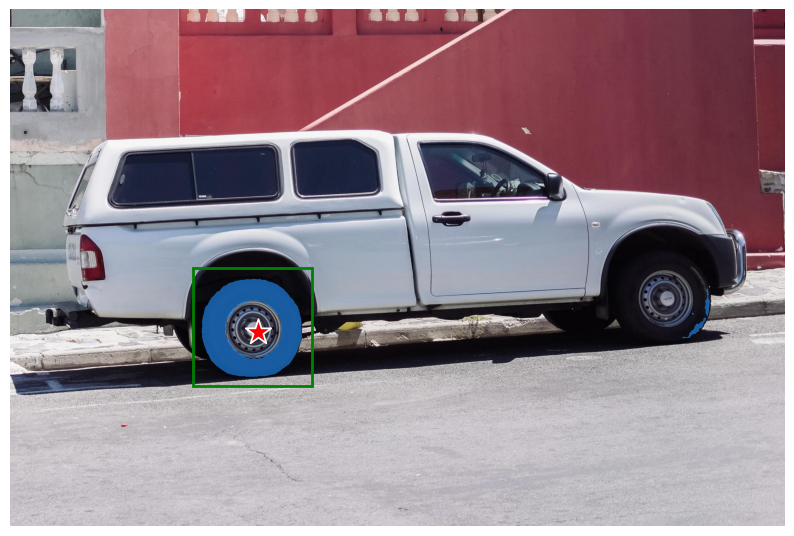

In [39]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_mask(masks[0], plt.gca())
show_box(input_box, plt.gca())
show_points(input_point, input_label, plt.gca())
plt.axis("off")
plt.show()

## Interactive segmentation with Gradio
[back to top ⬆️](#Table-of-contents:)

Now, you can try SAM on own image. Upload image to input window and click on desired point, model predict segment based on your image and point. 

In [40]:
class Segmenter:
    def __init__(self, ov_encoder, ov_predictor):
        self.encoder = ov_encoder
        self.predictor = ov_predictor
        self._img_embeddings = None
        self._high_res_features_256 = None
        self._high_res_features_128 = None

    def set_image(self, img: np.ndarray):
        if self._img_embeddings is not None:
            del self._img_embeddings
        preprocessed_image = preprocess_image(img, resizer)
        encoding_results = self.encoder(preprocessed_image)
        image_embeddings = encoding_results[ov_encoder.output(0)]
        self._img_embeddings = image_embeddings
        self._high_res_features_256 = encoding_results[ov_encoder.output(1)]
        self._high_res_features_128 = encoding_results[ov_encoder.output(2)]
        return img

    def get_mask(self, points, img):
        coord = np.array(points)
        coord = np.concatenate([coord, np.array([[0, 0]])], axis=0)
        coord = coord[None, :, :]
        label = np.concatenate([np.ones(len(points)), np.array([-1])], axis=0)[None, :].astype(np.float32)
        coord = resizer.apply_coords(coord, img.shape[:2]).astype(np.float32)
        if self._img_embeddings is None:
            self.set_image(img)
        inputs = {
            "image_embeddings": self._img_embeddings,
            "high_res_feats_256": self._high_res_features_256,
            "high_res_feats_128": self._high_res_features_128,
            "point_coords": coord,
            "point_labels": label,
        }

        results = self.predictor(inputs)
        masks = results[ov_predictor.output(0)]
        masks = postprocess_masks(masks, img.shape[:-1], resizer)

        masks = masks > 0.0
        mask = masks[0]
        mask = np.transpose(mask, (1, 2, 0))
        return mask


segmenter = Segmenter(ov_encoder, ov_predictor)

In [ ]:
if not Path("gradio_helper.py").exists():
    r = requests.get(url="https://raw.githubusercontent.com/openvinotoolkit/openvino_notebooks/latest/notebooks/segment-anything/gradio_helper.py")
    open("gradio_helper.py", "w").write(r.text)

from gradio_helper import make_demo

demo = make_demo(segmenter)

try:
    demo.launch()
except Exception:
    demo.launch(share=True)
# If you are launching remotely, specify server_name and server_port
# EXAMPLE: `demo.launch(server_name="your server name", server_port="server port in int")`
# To learn more please refer to the Gradio docs: https://gradio.app/docs/

In [ ]:
# please uncomment and run this cell for stopping gradio interface
# demo.close()

## Run OpenVINO model in automatic mask generation mode
[back to top ⬆️](#Table-of-contents:)

Since SAM2 can efficiently process prompts, masks for the entire image can be generated by sampling a large number of prompts over an image.
`automatic_mask_generation` function implements this capability.
It works by sampling single-point input prompts in a grid over the image, from each of which SAM can predict multiple masks. Then, masks are filtered for quality and deduplicated using non-maximal suppression. Additional options allow for further improvement of mask quality and quantity, such as running prediction on multiple crops of the image or postprocessing masks to remove small disconnected regions and holes.

In [42]:
mask_generation_helper_file_name = "automatic_mask_generation_helper.py"

if not Path(mask_generation_helper_file_name).exists():
    r = requests.get(
        url=f"https://raw.githubusercontent.com/openvinotoolkit/openvino_notebooks/latest/notebooks/segment-anything/{mask_generation_helper_file_name}",
    )
    open(mask_generation_helper_file_name, "w").write(r.text)

In [43]:
from automatic_mask_generation_helper import AutomaticMaskGenerationHelper

mask_generator_helper = AutomaticMaskGenerationHelper(resizer, ov_predictor, ov_encoder)

There are several tunable parameters in automatic mask generation that control how densely points are sampled and what the thresholds are for removing low quality or duplicate masks. Additionally, generation can be automatically run on crops of the image to get improved performance on smaller objects, and post-processing can remove stray pixels and holes

In [44]:
prediction = mask_generator_helper.automatic_mask_generation(image)

`automatic_mask_generation` returns a list over masks, where each mask is a dictionary containing various data about the mask. These keys are:

* `segmentation` : the mask
* `area` : the area of the mask in pixels
* `bbox` : the boundary box of the mask in XYWH format
* `predicted_iou` : the model's own prediction for the quality of the mask
* `point_coords` : the sampled input point that generated this mask
* `stability_score` : an additional measure of mask quality
* `crop_box` : the crop of the image used to generate this mask in XYWH format

In [45]:
print(f"Number of detected masks: {len(prediction)}")
print(f"Annotation keys: {prediction[0].keys()}")

Number of detected masks: 11
Annotation keys: dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


  0%|          | 0/11 [00:00<?, ?it/s]

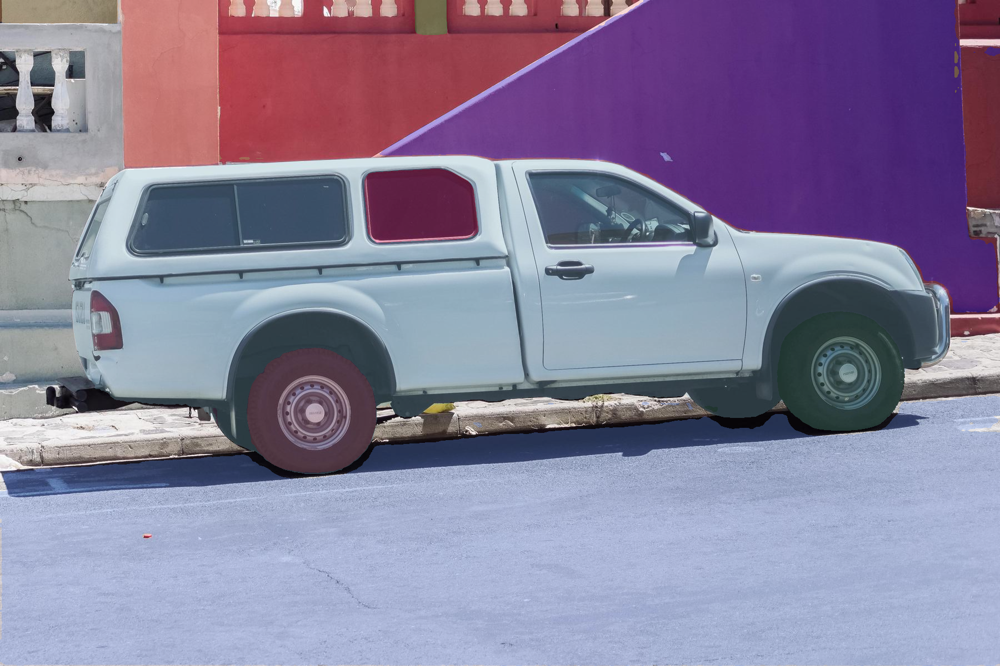

In [46]:
import PIL
from automatic_mask_generation_helper import draw_anns

out = draw_anns(image, prediction)
cv2.imwrite("result.png", out[:, :, ::-1])

PIL.Image.open("result.png")

## Optimize encoder using NNCF Post-training Quantization API
[back to top ⬆️](#Table-of-contents:)

[NNCF](https://github.com/openvinotoolkit/nncf) provides a suite of advanced algorithms for Neural Networks inference optimization in OpenVINO with minimal accuracy drop.

Since encoder costing much more time than other parts in SAM2 inference pipeline, we will use 8-bit quantization in post-training mode (without the fine-tuning pipeline) to optimize encoder of SAM2.

The optimization process contains the following steps:

1. Create a Dataset for quantization.
2. Run `nncf.quantize` for getting an optimized model.
3. Serialize OpenVINO IR model, using the `openvino.save_model` function.

In [47]:
from notebook_utils import quantization_widget

to_quantize = quantization_widget(False)
to_quantize

Checkbox(value=True, description='Quantization')

In [62]:
# Fetch `skip_kernel_extension` module
skip_kernel_extension_file_name = "skip_kernel_extension.py"

if not Path(skip_kernel_extension_file_name).exists():
    r = requests.get(
        url=f"https://raw.githubusercontent.com/openvinotoolkit/openvino_notebooks/latest/utils/{skip_kernel_extension_file_name}",
    )
    open(skip_kernel_extension_file_name, "w").write(r.text)

%load_ext skip_kernel_extension

The skip_kernel_extension extension is already loaded. To reload it, use:
  %reload_ext skip_kernel_extension


### Prepare a calibration dataset
[back to top ⬆️](#Table-of-contents:)

Download COCO dataset. Since the dataset is used to calibrate the model's parameter instead of fine-tuning it, we don't need to download the label files.

In [63]:
%%skip not $to_quantize.value

from zipfile import ZipFile

DATA_URL = "https://ultralytics.com/assets/coco128.zip"
OUT_DIR = Path(".")

if not (OUT_DIR / "coco128/images/train2017").exists():
    download_file(DATA_URL, directory=OUT_DIR, show_progress=True)
    with ZipFile("coco128.zip", "r") as zip_ref:
        zip_ref.extractall(OUT_DIR)

'coco128.zip' already exists.


Create an instance of the `nncf.Dataset` class that represents the calibration dataset. For PyTorch, we can pass an instance of the `torch.utils.data.DataLoader` object.

In [64]:
%%skip not $to_quantize.value

import torch.utils.data as data


class COCOLoader(data.Dataset):
    def __init__(self, images_path):
        self.images = list(Path(images_path).iterdir())

    def __getitem__(self, index):
        image_path = self.images[index]
        image = cv2.imread(str(image_path))
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        return image

    def __len__(self):
        return len(self.images)


coco_dataset = COCOLoader(OUT_DIR / "coco128/images/train2017")
calibration_loader = torch.utils.data.DataLoader(coco_dataset)

The transformation function is a function that takes a sample from the dataset and returns data that can be passed to the model for inference.

In [65]:
%%skip not $to_quantize.value


import nncf


def transform_fn(image_data):
    """
    Quantization transform function. Extracts and preprocess input data from dataloader item for quantization.
    Parameters:
        image_data: image data produced by DataLoader during iteration
    Returns:
        input_tensor: input data in Dict format for model quantization
    """
    image = image_data.numpy()
    processed_image = preprocess_image(np.squeeze(image), resizer)
    return processed_image


calibration_dataset = nncf.Dataset(calibration_loader, transform_fn)

INFO:nncf:NNCF initialized successfully. Supported frameworks detected: torch, openvino


### Run quantization and serialize OpenVINO IR model
[back to top ⬆️](#Table-of-contents:)

The `nncf.quantize` function provides an interface for model quantization. It requires an instance of the OpenVINO Model and quantization dataset. It is available for models in the following frameworks: `PyTorch`, `TensorFlow 2.x`, `ONNX`, and `OpenVINO IR`. 

Optionally, some additional parameters for the configuration quantization process (number of samples for quantization, preset, model type, etc.) can be provided. `model_type` can be used to specify quantization scheme required for specific type of the model. For example, Transformer models such as SAM require a special quantization scheme to preserve accuracy after quantization. To achieve a better result, we will use a `mixed` quantization preset. It provides symmetric quantization of weights and asymmetric quantization of activations.

>**Note**: Model post-training quantization is time-consuming process. Be patient, it can take several minutes depending on your hardware.

In [ ]:
%%skip not $to_quantize.value

model = core.read_model(ov_encoder_path)
quantized_model = nncf.quantize(
    model,
    calibration_dataset,
    model_type=nncf.parameters.ModelType.TRANSFORMER,
    subset_size=128,
)
print("model quantization finished")

In [ ]:
ov_encoder_path_int8 = "ov_image_encoder_int8.xml"

In [67]:
%%skip not $to_quantize.value

ov.save_model(quantized_model, ov_encoder_path_int8)

### Validate Quantized Model Inference
[back to top ⬆️](#Table-of-contents:)

We can reuse the previous code to validate the output of `INT8` model.

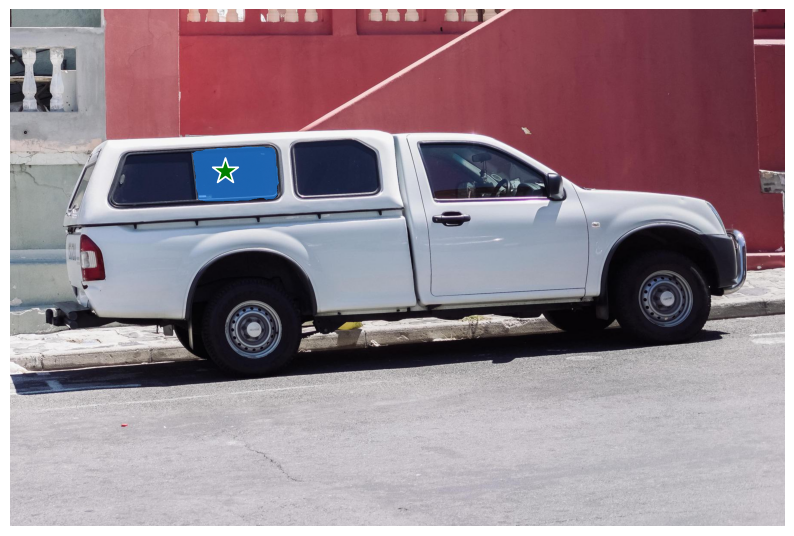

In [68]:
%%skip not $to_quantize.value


# Load INT8 model and run pipeline again
ov_encoder_model_int8 = core.read_model(ov_encoder_path_int8)
ov_encoder_int8 = core.compile_model(ov_encoder_model_int8, device.value)
encoding_results = ov_encoder_int8(preprocessed_image)
image_embeddings = encoding_results[ov_encoder_int8.output(0)]
high_res_256 = encoding_results[ov_encoder_int8.output(1)]
high_res_128 = encoding_results[ov_encoder_int8.output(2)]

input_point = np.array([[500, 375]])
input_label = np.array([1])
coord = np.concatenate([input_point, np.array([[0.0, 0.0]])], axis=0)[None, :, :]
label = np.concatenate([input_label, np.array([-1])], axis=0)[None, :].astype(np.float32)

coord = resizer.apply_coords(coord, image.shape[:2]).astype(np.float32)
inputs = {
    "image_embeddings": image_embeddings,
    "high_res_feats_256": high_res_256,
    "high_res_feats_128": high_res_128,
    "point_coords": coord,
    "point_labels": label,
}
results = ov_predictor(inputs)

masks = results[ov_predictor.output(0)]
masks = postprocess_masks(masks, image.shape[:-1], resizer)
masks = masks > 0.0
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_mask(masks, plt.gca())
show_points(input_point, input_label, plt.gca())
plt.axis("off")
plt.show()

Run `INT8` model in automatic mask generation mode

In [69]:
%%skip not $to_quantize.value


mask_generator_helper_int8 = AutomaticMaskGenerationHelper(resizer, ov_predictor, ov_encoder_int8)

prediction = mask_generator_helper_int8.automatic_mask_generation(image)
out = draw_anns(image, prediction)
cv2.imwrite("result_int8.png", out[:, :, ::-1])
PIL.Image.open("result_int8.png")

  0%|          | 0/5 [00:00<?, ?it/s]

### Compare Performance of the Original and Quantized Models
[back to top ⬆️](#Table-of-contents:)


Finally, use the OpenVINO [Benchmark Tool](https://docs.openvino.ai/2024/learn-openvino/openvino-samples/benchmark-tool.html) to measure the inference performance of the `FP32` and `INT8` models.

In [71]:
if Path(ov_encoder_path).exists() and Path(ov_encoder_path_int8).exists():
    # Inference FP32 model (OpenVINO IR)
    !benchmark_app -m $ov_encoder_path -d $device.value

[Step 1/11] Parsing and validating input arguments
[ INFO ] Parsing input parameters
[Step 2/11] Loading OpenVINO Runtime
[ WARNING ] Default duration 120 seconds is used for unknown device AUTO
[ INFO ] OpenVINO:
[ INFO ] Build ................................. 2024.3.0-16041-1e3b88e4e3f-releases/2024/3
[ INFO ] 
[ INFO ] Device info:
[ INFO ] AUTO
[ INFO ] Build ................................. 2024.3.0-16041-1e3b88e4e3f-releases/2024/3
[ INFO ] 
[ INFO ] 
[Step 3/11] Setting device configuration
[ WARNING ] Performance hint was not explicitly specified in command line. Device(AUTO) performance hint will be set to PerformanceMode.THROUGHPUT.
[Step 4/11] Reading model files
[ INFO ] Loading model files
[ INFO ] Read model took 135.25 ms
[ INFO ] Original model I/O parameters:
[ INFO ] Model inputs:
[ INFO ]     image (node: image) : f32 / [...] / [1,3,1024,1024]
[ INFO ] Model outputs:
[ INFO ]     ***NO_NAME*** (node: aten::view/Reshape_2) : f32 / [...] / [1,256,64,64]
[ INFO ]     

In [72]:
if Path(ov_encoder_path).exists() and Path(ov_encoder_path_int8).exists():
    # Inference INT8 model (OpenVINO IR)
    !benchmark_app -m $ov_encoder_path_int8 -d $device.value

[Step 1/11] Parsing and validating input arguments
[ INFO ] Parsing input parameters
[Step 2/11] Loading OpenVINO Runtime
[ WARNING ] Default duration 120 seconds is used for unknown device AUTO
[ INFO ] OpenVINO:
[ INFO ] Build ................................. 2024.3.0-16041-1e3b88e4e3f-releases/2024/3
[ INFO ] 
[ INFO ] Device info:
[ INFO ] AUTO
[ INFO ] Build ................................. 2024.3.0-16041-1e3b88e4e3f-releases/2024/3
[ INFO ] 
[ INFO ] 
[Step 3/11] Setting device configuration
[ WARNING ] Performance hint was not explicitly specified in command line. Device(AUTO) performance hint will be set to PerformanceMode.THROUGHPUT.
[Step 4/11] Reading model files
[ INFO ] Loading model files
[ INFO ] Read model took 167.08 ms
[ INFO ] Original model I/O parameters:
[ INFO ] Model inputs:
[ INFO ]     image (node: image) : f32 / [...] / [1,3,1024,1024]
[ INFO ] Model outputs:
[ INFO ]     ***NO_NAME*** (node: aten::view/Reshape_2) : f32 / [...] / [1,256,64,64]
[ INFO ]     